<a href="https://colab.research.google.com/github/jmcajigas/Aprendizaje-Automatico/blob/main/Proyecto_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import files
import pandas as pd
import seaborn as sns
import numpy as np
from sklearn.preprocessing import LabelEncoder
from scipy.stats import zscore
from pandas.core.dtypes.api import is_numeric_dtype, is_string_dtype
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB as G, MultinomialNB as M, BernoulliNB as B
from scipy.stats import randint
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_score
from xgboost import XGBClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from pandas.core.dtypes.api import is_numeric_dtype, is_string_dtype, is_categorical_dtype

In [4]:
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"leviarias","key":"b1c4015ed5b1d6231a5c4272a0a722e9"}'}

In [3]:
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [4]:
#!/bin/bash
! kaggle datasets download purumalgi/music-genre-classification
! unzip music-genre-classification.zip

Dataset URL: https://www.kaggle.com/datasets/purumalgi/music-genre-classification
License(s): other
  0% 0.00/1.29M [00:00<?, ?B/s]
100% 1.29M/1.29M [00:00<00:00, 670MB/s]
Archive:  music-genre-classification.zip
  inflating: submission.csv          
  inflating: test.csv                
  inflating: train.csv               


In [5]:
submission = pd.read_csv('submission.csv')
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

## Analisis Univariado

In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17996 entries, 0 to 17995
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Artist Name         17996 non-null  object 
 1   Track Name          17996 non-null  object 
 2   Popularity          17568 non-null  float64
 3   danceability        17996 non-null  float64
 4   energy              17996 non-null  float64
 5   key                 15982 non-null  float64
 6   loudness            17996 non-null  float64
 7   mode                17996 non-null  int64  
 8   speechiness         17996 non-null  float64
 9   acousticness        17996 non-null  float64
 10  instrumentalness    13619 non-null  float64
 11  liveness            17996 non-null  float64
 12  valence             17996 non-null  float64
 13  tempo               17996 non-null  float64
 14  duration_in min/ms  17996 non-null  float64
 15  time_signature      17996 non-null  int64  
 16  Clas

In [7]:
num_cols = [c for c in train.columns if is_numeric_dtype(train[c])]
cat_cols = [c for c in train.columns if is_string_dtype(train[c])]
print("Columnas numéricas:", num_cols)
print("Columnas categóricas:", cat_cols)

Columnas numéricas: ['Popularity', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_in min/ms', 'time_signature', 'Class']
Columnas categóricas: ['Artist Name', 'Track Name']


In [8]:
print("Registros Duplicados (antes):", train[train.duplicated()].shape[0])
train.drop_duplicates(inplace=True)
print("Registros Duplicados (despues):", train[train.duplicated()].shape[0])

Registros Duplicados (antes): 0
Registros Duplicados (despues): 0


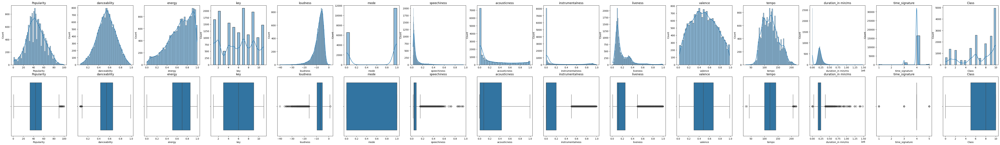

In [9]:
if num_cols:
    fig, ax = plt.subplots(2, len(num_cols), figsize=(5 * len(num_cols), 10))
    for i, c in enumerate(num_cols):
        sns.histplot(train[c], kde=True, ax=ax[0, i]); ax[0, i].set_title(c)
        sns.boxplot(x=train[c], ax=ax[1, i]); ax[1, i].set_title(c)
    plt.show()

In [10]:
len(train['Artist Name'].unique())

9149

In [11]:
len(train['Track Name'].unique())

15129

Hay demasiados datos unicos en la columnas con referencia al artista y al nombre de la pista, lo cual hace sentido, y en nuestro modelo de clasificación no aplican o no tienen un valor debido a la gran cantidad de clases.

## Analisis Multivariado

In [12]:
mapa = {
    0: 'Folk',
    1: 'Alt_Music',
    2: 'Blues',
    3: 'Bollywood',
    4: 'Country',
    5: 'HipHop',
    6: 'Indie_Alt',
    7: 'Instrumental',
    8: 'Metal',
    9: 'Pop',
    10: 'Rock'
}
train['Class Decoded'] = train['Class'].map(mapa)

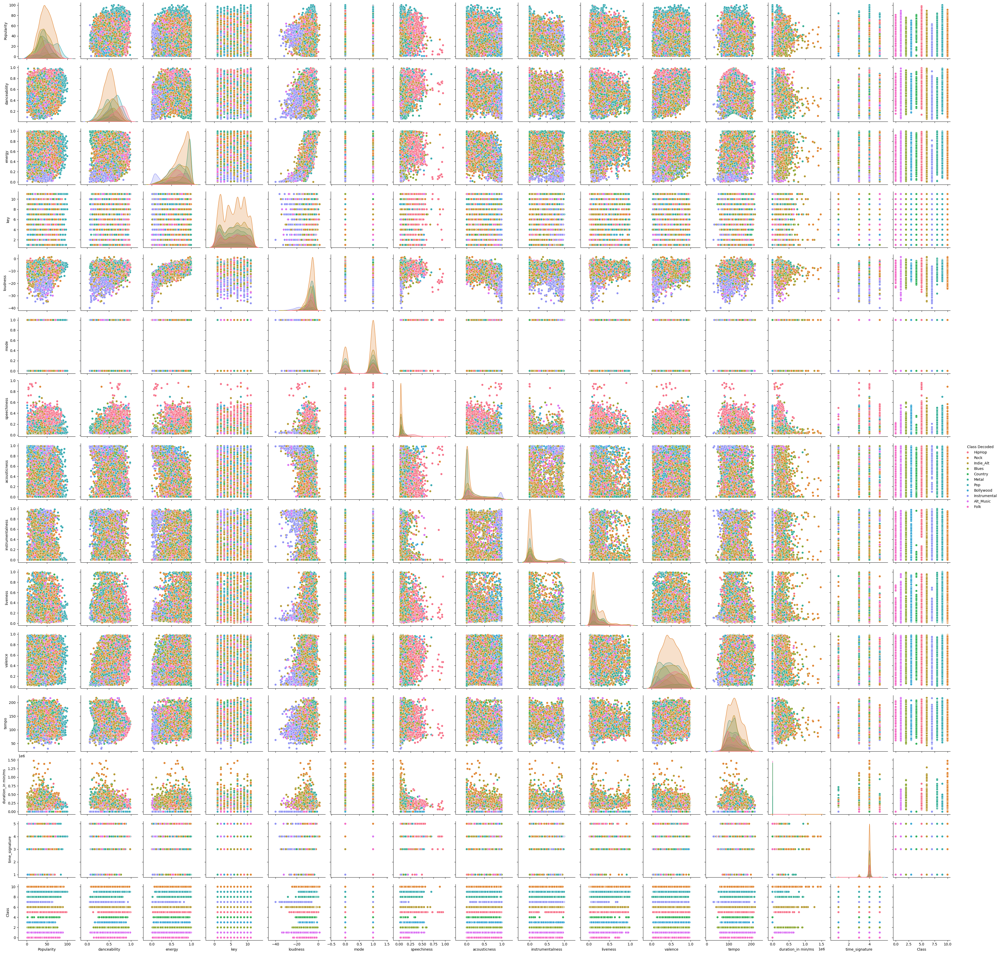

In [13]:
sns.pairplot(train[num_cols + ['Class Decoded']], hue='Class Decoded')

1. Se pueden visualizar clústeres en algunas combinaciones

acousticness vs energy, instrumentalness vs loudness, o valence vs danceability: se notan agrupaciones por color. Esto indica que ciertas combinaciones de características podrían ser buenas para separar géneros con un modelo.

2. Algunas variables poseen distribuciones muy sesgadas

instrumentalness, speechiness, acousticness tienen distribuciones que se concentran en valores bajos (o muy altos).


3. Hay aglunos ejes categóricos que no aportan

Algunas columnas con valores discretos como mode, key, time_signature no ayudan visualmente en este tipo de plots.

Se pueden excluir del PCA o del modelado inicial si se desea reducir ruido dimensional.

4. valence, danceability, energy pueden ser buenos candidatos para clasificacion
Estas variables muestran separación por color en varias combinaciones. Refuerza que son útiles para clustering o clasificación.

Por ejemplo, pop y EDM tienden a ser más altos en estos tres.

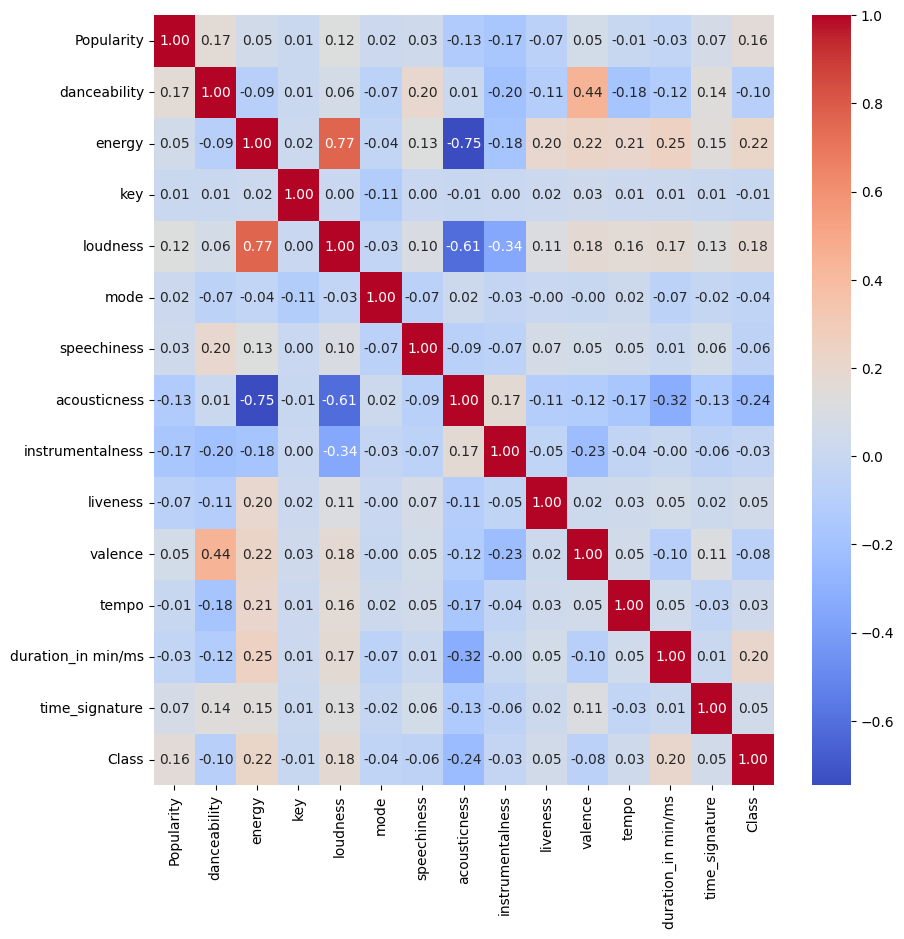

In [14]:
corr = train[num_cols].corr()
plt.figure(figsize=(10, 10))
sns.heatmap(corr, cmap='coolwarm', annot=True, fmt=',.2f')
plt.show()

<Axes: xlabel='Class Decoded'>

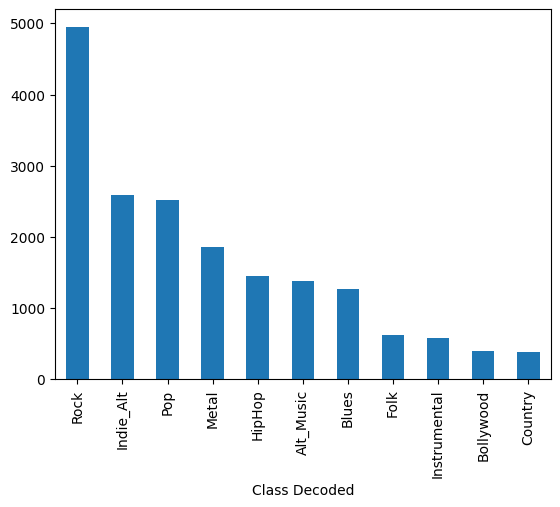

In [15]:
train['Class Decoded'].value_counts().plot(kind='bar')

La distribucion de los datos esta concentrada en las primeras 3 columnas (Rock, Indie y pop) lo cual nos puede generar un problema de sesgo. Mas adelante en el trabajo con los diferentes modelos sera necesario aplicar un metodo para balancear las clases, y mejorar sus rendimientos.

In [16]:
import plotly.express as px
import plotly.graph_objects as go
for col in num_cols:
  fig = px.violin(train, y = col, x = 'Class Decoded', box = True, color= 'Class Decoded')
  fig.show()

In [17]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17996 entries, 0 to 17995
Data columns (total 18 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Artist Name         17996 non-null  object 
 1   Track Name          17996 non-null  object 
 2   Popularity          17568 non-null  float64
 3   danceability        17996 non-null  float64
 4   energy              17996 non-null  float64
 5   key                 15982 non-null  float64
 6   loudness            17996 non-null  float64
 7   mode                17996 non-null  int64  
 8   speechiness         17996 non-null  float64
 9   acousticness        17996 non-null  float64
 10  instrumentalness    13619 non-null  float64
 11  liveness            17996 non-null  float64
 12  valence             17996 non-null  float64
 13  tempo               17996 non-null  float64
 14  duration_in min/ms  17996 non-null  float64
 15  time_signature      17996 non-null  int64  
 16  Clas

In [18]:
#X = train.drop(columns=['mode', 'key', 'time_signature', 'Artist Name', 'Track Name', 'duration_in min/ms'])
X = train.drop(columns = ['Artist Name', 'Track Name'])
X = X.drop(columns=['Class', 'Class Decoded'])
y = train['Class']

In [19]:
missing = (X.isnull().sum() / len(train)).sort_values(ascending = False)
missing = missing.index[missing > 0.5]
all_missing = list(set(missing))
X.drop(all_missing, axis=1, inplace=True)
print('Hay %d columna(s) con mas del 50%% de los datos vacios' % len(all_missing))
train.head()

Hay 0 columna(s) con mas del 50% de los datos vacios


,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class,Class Decoded
0,Bruno Mars,That's What I Like (feat. Gucci Mane),60.0,0.854,0.564,1.0,-4.964,1,0.0485,0.017100,NaN,0.0849,0.8990,134.071,234596.0,4,5,HipHop
1,Boston,Hitch a Ride,54.0,0.382,0.814,3.0,-7.230,1,0.0406,0.001100,0.004010,0.1010,0.5690,116.454,251733.0,4,10,Rock
2,The Raincoats,No Side to Fall In,35.0,0.434,0.614,6.0,-8.334,1,0.0525,0.486000,0.000196,0.3940,0.7870,147.681,109667.0,4,6,Indie_Alt
3,Deno,Lingo (feat. J.I & Chunkz),66.0,0.853,0.597,10.0,-6.528,0,0.0555,0.021200,NaN,0.1220,0.5690,107.033,173968.0,4,5,HipHop
4,Red Hot Chili Peppers,Nobody Weird Like Me - Remastered,53.0,0.167,0.975,2.0,-4.279,1,0.2160,0.000169,0.016100,0.1720,0.0918,199.060,229960.0,4,10,Rock


In [20]:
correlacion = X.corr().abs()
upper_tri = correlacion.where(np.triu(np.ones(correlacion.shape), k=1).astype(bool))
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.8)]
X = X.drop(columns=to_drop)
print("Columnas Eliminadas por alta colinealidad:",to_drop,'\nForma:',X.shape)

Columnas Eliminadas por alta colinealidad: [] 
Forma: (17996, 14)


In [21]:
from sklearn.feature_selection import VarianceThreshold

v = VarianceThreshold(threshold=0)
v.fit(X)
X = pd.DataFrame(v.transform(X), columns=X.columns[v.get_support()])
print("Eliminadas:", X.columns[~v.get_support()].tolist())
print("Shape:", X.shape)

Eliminadas: []
Shape: (17996, 14)


In [22]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17996 entries, 0 to 17995
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Popularity          17568 non-null  float64
 1   danceability        17996 non-null  float64
 2   energy              17996 non-null  float64
 3   key                 15982 non-null  float64
 4   loudness            17996 non-null  float64
 5   mode                17996 non-null  float64
 6   speechiness         17996 non-null  float64
 7   acousticness        17996 non-null  float64
 8   instrumentalness    13619 non-null  float64
 9   liveness            17996 non-null  float64
 10  valence             17996 non-null  float64
 11  tempo               17996 non-null  float64
 12  duration_in min/ms  17996 non-null  float64
 13  time_signature      17996 non-null  float64
dtypes: float64(14)
memory usage: 1.9 MB


In [23]:
from sklearn.impute import KNNImputer

knn_imputer = KNNImputer(n_neighbors=3)
X['Popularity'] = knn_imputer.fit_transform(X[['Popularity']])
X['instrumentalness'] = knn_imputer.fit_transform(X[['instrumentalness']])
X['key'] = knn_imputer.fit_transform(X[['key']])


Realizando el análisis exploratorio de datos, descubrimos que el dataset no tiene valores duplicados y que las columnas de “Popularity”, “Instrumentalness” y “Key” poseen algunos datos NaN, por lo que realizamos el proceso de KNN imputer para rellenar estos valores usando el método de vecinos más cercanos.

In [24]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17996 entries, 0 to 17995
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Popularity          17996 non-null  float64
 1   danceability        17996 non-null  float64
 2   energy              17996 non-null  float64
 3   key                 17996 non-null  float64
 4   loudness            17996 non-null  float64
 5   mode                17996 non-null  float64
 6   speechiness         17996 non-null  float64
 7   acousticness        17996 non-null  float64
 8   instrumentalness    17996 non-null  float64
 9   liveness            17996 non-null  float64
 10  valence             17996 non-null  float64
 11  tempo               17996 non-null  float64
 12  duration_in min/ms  17996 non-null  float64
 13  time_signature      17996 non-null  float64
dtypes: float64(14)
memory usage: 1.9 MB


<Axes: >

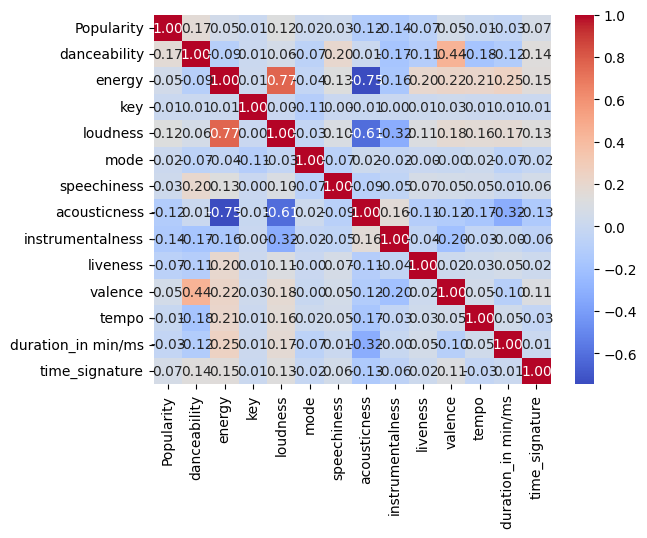

In [25]:
sns.heatmap(X.corr(), annot=True, cmap='coolwarm', fmt=',.2f')

In [26]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=0)

smote_X, smote_y = smote.fit_resample(X, y)

Debido a que nuestro dataset posee datos desbalanceados es necesario generar un conjunto nuevo usando SMOTE y asi obtener clases balanceadas, aumentando artificialmente la clase minoritaria mediante interpolación entre vecinos cercanos.

<Axes: xlabel='Class'>

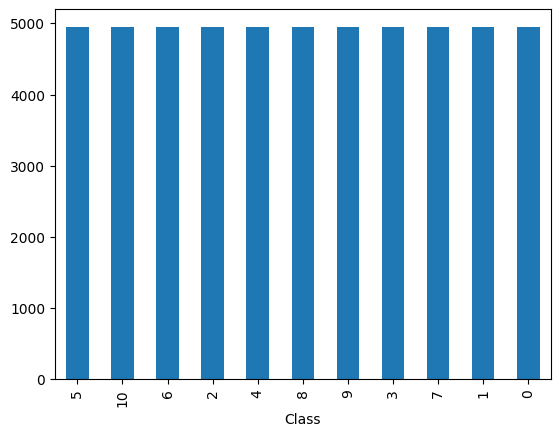

In [27]:
smote_y.value_counts().plot(kind='bar')

In [28]:
smote_X.drop(columns = ['tempo', 'key', 'time_signature'], inplace =  True)

Como mencionaos en el analisis multivariable, las caracteristicas de "Key" y "time_signature" no estaban aportando para la clasificacion, ya que no presentaba una relacion considerable con la variable objetivo (Class) por lo que las eliminamos.

In [29]:
smote_X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54439 entries, 0 to 54438
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Popularity          54439 non-null  float64
 1   danceability        54439 non-null  float64
 2   energy              54439 non-null  float64
 3   loudness            54439 non-null  float64
 4   mode                54439 non-null  float64
 5   speechiness         54439 non-null  float64
 6   acousticness        54439 non-null  float64
 7   instrumentalness    54439 non-null  float64
 8   liveness            54439 non-null  float64
 9   valence             54439 non-null  float64
 10  duration_in min/ms  54439 non-null  float64
dtypes: float64(11)
memory usage: 4.6 MB


### Division del Dataset

In [30]:
X_train, X_test, y_train, y_test = train_test_split(smote_X, smote_y, test_size=0.2, random_state=0, stratify= smote_y)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((43551, 11), (10888, 11), (43551,), (10888,))

Después de realizar el análisis y dado que estamos trabajando con un problema de clasificación multiclase, decidimos trabajar con técnicas de ensamble. Entrenaremos 3 diferentes modelos, Random Forest, XGBoost, y un Stacking que combine los dos modelos mencionados.

Ya habíamos trabajado con modelos de base, como arboles de decisión, regresión logística y KNN, sin embargo, el resultado de accuracy mas alto que obtuvimos fue de 70% en general, ya si tomamos los datos por cada característica tenemos una gran variabilidad de precisión, por lo que esperamos un comportamiento mayor o mas estable, utilizando modelos más robustos.


| Modelo              | Capacidad de modelado | Interacciones complejas | Sensible al ruido    | Escalabilidad            | Interpretabilidad |
| ------------------- | --------------------- | ----------------------- | -------------------- | ------------------------ | ----------------- |
| Regresión Logística | Baja                  | No                      | Moderada             | Alta                     | Alta              |
| Árbol de Decisión   | Media                 | Algo limitada           | Alta                 | Alta                     | Media-Alta        |
| KNN                 | Baja                  | No                      | Alta                 | Baja (costoso en testeo) | Baja              |
| Random Forest       | Alta                  | Sí                      | Baja                 | Buena                    | Media             |
| XGBoost             | Muy alta              | Sí (mejor que RF)       | Muy baja             | Muy buena                | Media             |
| Stacking            | Muy alta              | Sí (meta-modelo)        | Depende del ensamble | Variable                 | Baja              |


##RANDOM FOREST

In [32]:
param_grid_rf = {
    "clasificador_RF__n_estimators": randint(50, 300),
    "clasificador_RF__max_depth": [None] + list(range(5, 30)),
    "clasificador_RF__min_samples_split": randint(2, 20),
    "clasificador_RF__min_samples_leaf": randint(1, 20),
    "clasificador_RF__max_features": [None, "sqrt", "log2"]
}

In [33]:
RF = RandomForestClassifier(random_state=42)

In [34]:
pipeline_RF = Pipeline(
    steps = [
        ('clasificador_RF',RF)
    ]
)
pipeline_RF

Pipeline(steps=[('clasificador_RF', RandomForestClassifier(random_state=42))])

In [35]:
RS_RF = RandomizedSearchCV(
    pipeline_RF,  # pipeline que incluye preprocesamiento y modelo
    param_distributions=param_grid_rf,
    n_iter=10,                # número de combinaciones a probar
    scoring="accuracy",       # métrica
    cv=5,                     # validación cruzada
    verbose=1,
    n_jobs=-1,                # usa todos los núcleos posibles
    random_state=42
)

In [37]:
RS_RF.fit(X_train, y_train)
print("Mejores parámetros encontrados:")
print(RS_RF.best_params_)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Mejores parámetros encontrados:
{'clasificador_RF__max_depth': 23, 'clasificador_RF__max_features': None, 'clasificador_RF__min_samples_leaf': 3, 'clasificador_RF__min_samples_split': 6, 'clasificador_RF__n_estimators': 100}


In [38]:
print(f'Exactitud RF: {RS_RF.best_estimator_.score(X_test, y_test)*100} %')
scores = cross_val_score(estimator = pipeline_RF,
                         X = X_test, y = y_test,
                         cv = 3, scoring='accuracy',
                         n_jobs=-1)
print(f'Exactitud CV RF: {scores}')
print(f'Exactitud CV RF: {np.mean(scores):.3f}' f' +/- {np.std(scores):.3f}')

Exactitud RF: 74.33872152828802 %
Exactitud CV RF: [0.69779614 0.67677046 0.69137503]
Exactitud CV RF: 0.689 +/- 0.009


In [39]:
y_pred_dt_test = RS_RF.predict(X_test)
print(classification_report(y_test, y_pred_dt_test,zero_division=True))

              precision    recall  f1-score   support

           0       0.93      0.95      0.94       990
           1       0.49      0.51      0.50       990
           2       0.70      0.82      0.76       990
           3       0.96      0.97      0.96       990
           4       0.93      0.98      0.96       989
           5       0.78      0.86      0.82       990
           6       0.44      0.36      0.40       990
           7       0.99      0.97      0.98       990
           8       0.72      0.81      0.76       990
           9       0.69      0.59      0.63       989
          10       0.43      0.36      0.39       990

    accuracy                           0.74     10888
   macro avg       0.73      0.74      0.74     10888
weighted avg       0.73      0.74      0.74     10888



##XGBOOST

In [40]:
XGB = XGBClassifier(random_state=7, tree_method="hist", device='cuda')
XGB

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device='cuda', early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=7, ...)

In [41]:
param_grid_xgb = {
    "n_estimators": randint(20, 100),
    "max_depth": randint(3, 10)
}

In [42]:
RS_XGB = RandomizedSearchCV(XGB, param_distributions=param_grid_xgb,
                           n_iter=3, scoring="accuracy", cv=3, verbose=2,
                           n_jobs=-1,random_state=7)

In [43]:
%%time
RS_XGB.fit(X_train, y_train)
print("Mejores parámetros encontrados:")
print(RS_XGB.best_params_)

Fitting 3 folds for each of 3 candidates, totalling 9 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[20:43:27] WARNING: /workspace/src/context.cc:43: No visible GPU is found, setting device to CPU.

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[20:43:27] WARNING: /workspace/src/context.cc:196: XGBoost is not compiled with CUDA support.



Mejores parámetros encontrados:
{'max_depth': 9, 'n_estimators': 87}
CPU times: user 13.9 s, sys: 128 ms, total: 14 s
Wall time: 33.6 s


In [44]:
%%time
XGB_ori = RS_XGB.best_estimator_
scores = cross_val_score(estimator = XGB_ori, cv = 3, scoring='accuracy',
                         n_jobs=-1, X = X_train, y = y_train)
print(f'Exactitud CV XGB: {scores}')
print(f'Exactitud CV XGB: {np.mean(scores):.3f}' f' +/- {np.std(scores):.3f}')

Exactitud CV XGB: [0.7505683  0.74808845 0.75139492]
Exactitud CV XGB: 0.750 +/- 0.001
CPU times: user 106 ms, sys: 20.3 ms, total: 127 ms
Wall time: 17.9 s


In [45]:
y_pred_dt_test = RS_XGB.predict(X_test)
print(classification_report(y_test, y_pred_dt_test,zero_division=True))

              precision    recall  f1-score   support

           0       0.96      0.97      0.97       990
           1       0.52      0.54      0.53       990
           2       0.75      0.83      0.79       990
           3       0.98      0.98      0.98       990
           4       0.96      0.99      0.97       989
           5       0.83      0.88      0.85       990
           6       0.43      0.38      0.40       990
           7       0.99      0.99      0.99       990
           8       0.76      0.80      0.78       990
           9       0.71      0.63      0.67       989
          10       0.44      0.41      0.43       990

    accuracy                           0.76     10888
   macro avg       0.76      0.76      0.76     10888
weighted avg       0.76      0.76      0.76     10888



## Stacking

In [46]:
param_dist_sta = {
    "Stacking__final_estimator__n_estimators": randint(50, 300),
    "Stacking__final_estimator__max_depth": [None] + list(range(5, 30))
}

In [47]:
estimators_sta = [
    ('random_forest', RS_RF.best_estimator_.named_steps["clasificador_RF"]),
    ('XGboost', RS_XGB.best_estimator_)
]

In [48]:
pipeline_STA = Pipeline(
    steps = [
        #('Prepocesamiento',pipeline_F2),
        ('Stacking',StackingClassifier(estimators=estimators_sta,
                                       final_estimator=RandomForestClassifier(random_state=90),
                                       cv = 2))
    ]
)
pipeline_STA

Pipeline(steps=[('Stacking',
                 StackingClassifier(cv=2,
                                    estimators=[('random_forest',
                                                 RandomForestClassifier(max_depth=23,
                                                                        max_features=None,
                                                                        min_samples_leaf=3,
                                                                        min_samples_split=6,
                                                                        random_state=42)),
                                                ('XGboost',
                                                 XGBClassifier(base_score=None,
                                                               booster=None,
                                                               callbacks=None,
                                                               colsample_bylevel=None,
                                                               colsample_bynode=None,
                                                               colsample_bytree=None,
                                                               device='cuda',
                                                               early_st...
                                                               learning_rate=None,
                                                               max_bin=None,
                                                               max_cat_threshold=None,
                                                               max_cat_to_onehot=None,
                                                               max_delta_step=None,
                                                               max_depth=9,
                                                               max_leaves=None,
                                                               min_child_weight=None,
                                                               missing=nan,
                                                               monotone_constraints=None,
                                                               multi_strategy=None,
                                                               n_estimators=87,
                                                               n_jobs=None,
                                                               num_parallel_tree=None,
                                                               objective='multi:softprob', ...))],
                                    final_estimator=RandomForestClassifier(random_state=90)))])

In [49]:
RS_STA = RandomizedSearchCV(
    estimator=pipeline_STA,
    param_distributions=param_dist_sta,
    n_iter=10,
    cv=5,
    scoring="accuracy",
    n_jobs=-1,
    verbose=1,
    random_state=42
)

In [50]:
RS_STA.fit(X_train, y_train)
print("Mejores parámetros encontrados:")
print(RS_STA.best_params_)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[21:49:17] WARNING: /workspace/src/context.cc:43: No visible GPU is found, setting device to CPU.

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[21:49:17] WARNING: /workspace/src/context.cc:196: XGBoost is not compiled with CUDA support.

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[21:50:11] WARNING: /workspace/src/context.cc:43: No visible GPU is found, setting device to CPU.

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[21:50:11] WARNING: /workspace/src/context.cc:196: XGBoost is not compiled with CUDA support.

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[21:50:16] WARNING: /workspace/src/context.cc:43: No visible GPU is found, setting device to CPU.

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[21:50:16] WARNING: /workspace/src/context.cc:196: XGBoost is n

Mejores parámetros encontrados:
{'Stacking__final_estimator__max_depth': 18, 'Stacking__final_estimator__n_estimators': 156}


In [51]:
STA_model = RS_STA.best_estimator_

In [52]:
print(f'Exactitud STA: {STA_model.score(X_test, y_test)*100} %')
scores = cross_val_score(estimator = pipeline_STA,
                         X = X_test, y = y_test ,
                         cv = 3,
                         n_jobs=-1)
print(f'Exactitud CV STA: {scores}')
print(f'Exactitud CV STA: {np.mean(scores):.3f}' f' +/- {np.std(scores):.3f}')

Exactitud STA: 77.01138868479059 %
Exactitud CV STA: [0.68264463 0.6850372  0.68696611]
Exactitud CV STA: 0.685 +/- 0.002


In [53]:
y_pred_dt_test = STA_model.predict(X_test)
print(classification_report(y_test, y_pred_dt_test,zero_division=True))

              precision    recall  f1-score   support

           0       0.96      0.97      0.96       990
           1       0.53      0.54      0.53       990
           2       0.75      0.82      0.78       990
           3       0.98      0.97      0.98       990
           4       0.96      0.99      0.97       989
           5       0.81      0.88      0.84       990
           6       0.51      0.36      0.42       990
           7       0.99      0.99      0.99       990
           8       0.76      0.83      0.80       990
           9       0.70      0.63      0.67       989
          10       0.46      0.49      0.48       990

    accuracy                           0.77     10888
   macro avg       0.76      0.77      0.77     10888
weighted avg       0.76      0.77      0.77     10888



In [62]:
import pickle

with open("escalado.pkl", "wb") as f:
    pickle.dump(scaler, f)

# Comparación de Rendimiento

## Datos de entrenamiento

### Classification Report

In [55]:
classes = list(mapa.values())
classifiers = [RF, XGB, STA_model]

print("Classes:", classes)
print("Classifiers:", classifiers)

Classes: ['Folk', 'Alt_Music', 'Blues', 'Bollywood', 'Country', 'HipHop', 'Indie_Alt', 'Instrumental', 'Metal', 'Pop', 'Rock']
Classifiers: [RandomForestClassifier(random_state=42), XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device='cuda', early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=7, ...), Pipeline(steps=[('Stacking',
                 StackingClassi

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[21:52:03] WARNING: /workspace/src/context.cc:43: No visible GPU is found, setting device to CPU.

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[21:52:03] WARNING: /workspace/src/context.cc:196: XGBoost is not compiled with CUDA support.



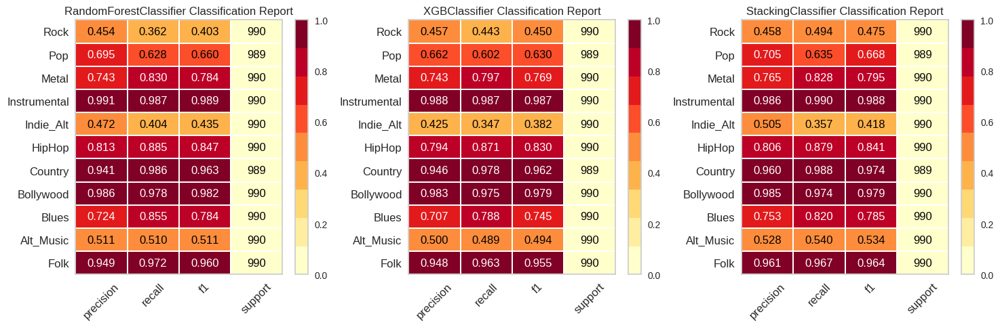

In [56]:
from yellowbrick.classifier import ClassificationReport

fig, axe = plt.subplots(ncols=3,nrows=1,figsize=(15, 5))
fig.tight_layout(pad=8.0)
visualgrid = [ClassificationReport(classifiers[0], classes=classes, support=True,ax=axe[0]),
              ClassificationReport(classifiers[1], classes=classes, support=True,ax=axe[1]),
              ClassificationReport(classifiers[2], classes=classes, support=True,ax=axe[2])]
for viz in visualgrid:
  viz.fit(X_train, y_train)
  viz.score(X_test, y_test)
  viz.finalize()
fig.show()

### Confusion Matrix

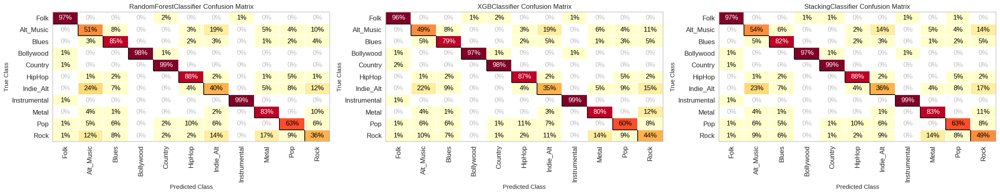

In [57]:
from yellowbrick.classifier import ConfusionMatrix

fig, axe = plt.subplots(ncols=3,nrows=1,figsize=(25, 5))
fig.tight_layout(pad=8.0)
visualgrid = [ConfusionMatrix(classifiers[0], classes=classes, support=True, percent=True, ax=axe[0]),
              ConfusionMatrix(classifiers[1], classes=classes, support=True, percent=True, ax=axe[1]),
              ConfusionMatrix(classifiers[2], classes=classes, support=True, percent=True, ax=axe[2])]
for viz in visualgrid:
  viz.fit(X_train, y_train)
  viz.score(X_test, y_test)
  viz.finalize()
fig.show()

### Class Prediction Error (CPE)

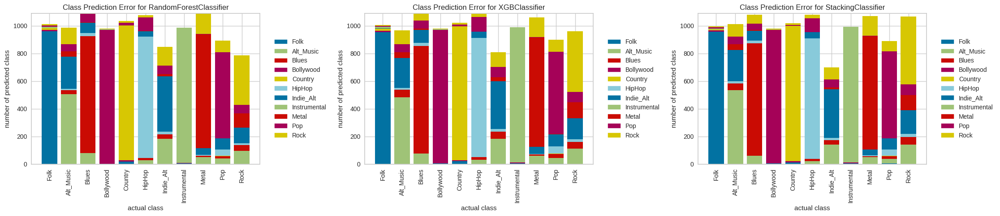

In [58]:
from yellowbrick.classifier import ClassPredictionError

fig, axe = plt.subplots(ncols=3,figsize=(25, 5))
fig.tight_layout(pad=8.0)
visualgrid = [ClassPredictionError(classifiers[0], classes=classes, ax=axe[0]),
              ClassPredictionError(classifiers[1], classes=classes, ax=axe[1]),
              ClassPredictionError(classifiers[2], classes=classes, ax=axe[2])]

for viz in visualgrid:
  viz.fit(X_train, y_train)
  viz.score(X_test, y_test)
  viz.finalize()
plt.show()

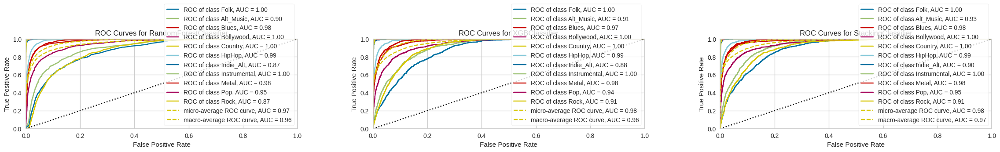

In [59]:
from yellowbrick.classifier import ROCAUC

fig, axe = plt.subplots(ncols=3,figsize=(25, 5))
fig.tight_layout(pad=8.0)
visualgrid = [ROCAUC(classifiers[0], classes=classes, ax=axe[0]),
              ROCAUC(classifiers[1], classes=classes, ax=axe[1]),
              ROCAUC(classifiers[2], classes=classes, ax=axe[2])]

for viz in visualgrid:
  viz.fit(X_train, y_train)
  viz.score(X_test, y_test)
  viz.finalize()

plt.show()

| Modelo            | Accuracy | Macro F1 | Observaciones clave                                                                 |
| ----------------- | -------- | -------- | ----------------------------------------------------------------------------------- |
| **Random Forest** | 0.74     | 0.74     | Buen rendimiento global pero caídas marcadas en algunas clases (como la 1, 6 y 10). |
| **XGBoost**       | 0.76     | 0.76     | Mejora respecto a Random Forest, especialmente en clases 1 y 10.                    |
| **Stacking**      | 0.77     | 0.77     | Mejor desempeño general. Se comporta de manera más balanceada.                      |

Clases bien clasificadas (alta precisión y recall en los tres modelos)

Clases 0, 3, 4, 7:
Muy buen rendimiento, con F1-scores mayores a 0.95. Estas clases pueden presentar patrones fáciles de aprender o bien diferenciados entre ellos.

Clases con bajo rendimiento consistente

Clase 1:
F1-score alrededor de 0.50 en todos los modelos. El modelo tiene dificultades para distinguir esta clase, probablemente por similaridad con otras clases o poca representatividad en los atributos.

Clase 6:
F1 baja (~0.40), especialmente en Random Forest. Mejora ligeramente en Stacking. Puede haber confusión con clases vecinas, o los datos de esta clase pueden ser más ruidosos o menos representativos.

Clase 10:
Desempeño débil aunque mejora en el modelo Stacking (F1 de 0.48). Este tipo de mejoras indica que la combinación de modelos puede ayudar a capturar patrones que los modelos individuales no captan bien.

Comparación entre modelos

XGBoost vs. Random Forest:

XGBoost supera a Random Forest en la mayoría de las clases con bajo desempeño (1, 6, 10), lo que indica que el aprendizaje basado en gradiente mejora la capacidad de distinguir clases más difíciles.

Stacking vs. XGBoost:

Stacking mejora ligeramente el performance global. Es especialmente útil en clases como la 10 (donde XGBoost tenía un F1 de 0.43, y Stacking sube a 0.48). Esto muestra que la combinación de modelos captura mejor los matices de las clases difíciles.

Esta es una tabla que realizamos con el objetivo de comparar todos los modelos que construimos para este proyecto, ya que nos parecio bastante interesante la mejora que nos proporciona el uso de modelos complejos para la clasificacion multiclase. El cambio más notable está en el manejo de clases difíciles (como 1, 6, 10), donde los modelos simples tienden a fallar con un porcentaje bastante bajo, mientras que los avanzados logran resultados aceptables:

| Modelo              | Accuracy esperada (aproximada) | Observaciones                                                                                             |
| ------------------- | ------------------------------ | --------------------------------------------------------------------------------------------------------- |
| Regresión Logística | \~55–65%                       | Baja capacidad para capturar relaciones no lineales y patrones complejos. Mala para clases poco lineales. |
| Árbol de Decisión   | \~60–68%                       | Mejor que RL, pero se sobreajusta fácilmente. No generaliza tan bien como Random Forest.                  |
| KNN                 | \~60–70%                       | Sensible a escalado, outliers y dimensión.   |
| Random Forest       | \~74%                          | Reduce sobreajuste. Generaliza mejor gracias a promediar múltiples árboles.                               |
| XGBoost             | \~76%                          | Aprende más eficientemente. Mejora el rendimiento en clases difíciles.                                    |
| Stacking            | \~77%                          | Combina fortalezas de varios modelos. Tiende a superar a modelos individuales.                            |




## EL MODELO ESCOGIDO FUE EL DE STACKING

In [54]:
import pickle

with open("modelo.pkl", "wb") as f:
    pickle.dump(STA_model, f)